<a href="https://colab.research.google.com/github/CVH4OYC/ML_lab/blob/main/NLP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Twitter — это онлайн-платформа социальных сетей, где люди делятся своими мыслями в виде твитов. Замечено, что некоторые люди злоупотребляют ею, чтобы твитнуть оскорбительный контент. Twitter пытается решить эту проблему, и мы поможем ему, создав сильную модель классификатора на основе NLP, чтобы различать негативные твиты и блокировать такие твиты. Можете ли вы построить сильную модель классификатора, чтобы предсказывать то же самое?

Каждая строка содержит текст твита и метку настроения. В обучающем наборе вам предоставляется слово или фраза, взятые из твита (selected_text), которые инкапсулируют предоставленное настроение.

При анализе CSV-файла обязательно удалите начальные и конечные кавычки из текстового поля, чтобы гарантировать, что вы не включите их в свое обучение.

Вы пытаетесь предсказать слово или фразу из твита, которая иллюстрирует указанное мнение. Слово или фраза должны включать все символы в этом диапазоне (т.е. включая запятые, пробелы и т.д.)

Столбцы:
textID - уникальный идентификатор для каждого фрагмента текста

текст - текст твита

настроение - общее настроение твита

Набор данных можно загрузить с Kaggle Competetions:
https://www.kaggle.com/c/tweet-sentiment-extraction/data?select=train.csv

Цель:
Понимание набора данных и очистка (при необходимости).
Постройте модели классификации для прогнозирования настроений в Twitter.
Сравните показатели оценки различных алгоритмов классификации.

In [ ]:
import sklearn
import keras
import nltk
import pandas as pd
import numpy as np
import re
import codecs

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
url = '/content/drive/MyDrive/datasets/Tweets.csv'

# Проверка данных

In [ ]:
questions = pd.read_csv(url,encoding='utf-8')
questions.columns=['textID','text','selected_text','sentiment']
questions.head()

,textID,text,selected_text,sentiment
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative
2,088c60f138,my boss is bullying me...,bullying me,negative
3,9642c003ef,what interview! leave me alone,leave me alone,negative
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative


In [ ]:
questions.tail()

,textID,text,selected_text,sentiment
27476,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative
27477,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative
27478,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive
27479,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive
27480,6f7127d9d7,All this flirting going on - The ATG smiles...,All this flirting going on - The ATG smiles. Y...,neutral


In [ ]:
questions.describe()

,textID,text,selected_text,sentiment
count,27481,27480,27480,27481
unique,27481,27480,22463,3
top,6f7127d9d7,All this flirting going on - The ATG smiles...,good,neutral
freq,1,1,199,11118


Все признаки категориальные

Очистка текста регулярными выражениями

In [ ]:
def standardize_text(df, text_field):
    df[text_field] = df[text_field].str.replace(r"http\S+", "")
    df[text_field] = df[text_field].str.replace(r"http", "")
    df[text_field] = df[text_field].str.replace(r"@\S+", "")
    df[text_field] = df[text_field].str.replace(r"[^A-Za-z0-9(),!?@\'\`\"\_\n]", " ")
    df[text_field] = df[text_field].str.replace(r"@", "at")
    df[text_field] = df[text_field].str.lower()
    return df

questions = standardize_text(questions, "text")
questions = standardize_text(questions, "selected_text")
questions.to_csv("clean_data.csv", index=False)
questions.head()

,textID,text,selected_text,sentiment
0,cb774db0d1,"i`d have responded, if i were going","i`d have responded, if i were going",neutral
1,549e992a42,sooo sad i will miss you here in san diego!!!,sooo sad,negative
2,088c60f138,my boss is bullying me...,bullying me,negative
3,9642c003ef,what interview! leave me alone,leave me alone,negative
4,358bd9e861,"sons of ****, why couldn`t they put them on t...","sons of ****,",negative


In [ ]:
clean_questions = pd.read_csv("clean_data.csv")
clean_questions.tail()

,textID,text,selected_text,sentiment
27476,4eac33d1c0,wish we could come see u on denver husband l...,d lost,negative
27477,4f4c4fc327,i`ve wondered about rake to. the client has ...,", don`t force",negative
27478,f67aae2310,yay good for both of you. enjoy the break - y...,yay good for both of you.,positive
27479,ed167662a5,but it was worth it ****.,but it was worth it ****.,positive
27480,6f7127d9d7,all this flirting going on - the atg smiles...,all this flirting going on - the atg smiles. y...,neutral


In [ ]:
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder()
clean_questions["sentiment"] = encoder.fit_transform(clean_questions[["sentiment"]]).astype(int)
clean_questions

,textID,text,selected_text,sentiment
0,cb774db0d1,"i`d have responded, if i were going","i`d have responded, if i were going",1
1,549e992a42,sooo sad i will miss you here in san diego!!!,sooo sad,0
2,088c60f138,my boss is bullying me...,bullying me,0
3,9642c003ef,what interview! leave me alone,leave me alone,0
4,358bd9e861,"sons of ****, why couldn`t they put them on t...","sons of ****,",0
...,...,...,...,...
27476,4eac33d1c0,wish we could come see u on denver husband l...,d lost,0
27477,4f4c4fc327,i`ve wondered about rake to. the client has ...,", don`t force",0
27478,f67aae2310,yay good for both of you. enjoy the break - y...,yay good for both of you.,2
27479,ed167662a5,but it was worth it ****.,but it was worth it ****.,2


In [ ]:
clean_questions.isnull().sum()

,0
textID,0
text,1
selected_text,1
sentiment,0


In [ ]:
clean_questions["text"] = clean_questions["text"].fillna("").astype(str)
clean_questions["selected_text"] = clean_questions["text"].fillna("").astype(str)
clean_questions.isnull().sum()

,0
textID,0
text,0
selected_text,0
sentiment,0


# Анализ данных

In [ ]:
clean_questions.groupby("sentiment").count()

,textID,text,selected_text
sentiment,,,
0,7781,7781,7781
1,11118,11118,11118
2,8582,8582,8582


Данные сбалансированны

 i`d have responded, if i were going  sooo sad i will miss you here in san diego!!! my boss is bullying me...  what interview! leave me alone  sons of ****, why couldn`t they put them on the releases we already bought ://www.dothebouncy.com/smf - some shameless plugging for the best rangers forum on earth 2am feedings for the baby are fun when he is all smiles and coos soooo high  both of you  journey!? wow... u just became cooler.  hehe... (is that possible!?)  as much as i love to be hopeful, i reckon the chances are minimal =p i`m never gonna get my cake and stuff i really really like the song love story by taylor swift my sharpie is running dangerously low on ink i want to go to music tonight but i lost my voice. test test from the lg env2 uh oh, i am sunburned  s`ok, trying to plot alternatives as we speak *sigh* i`ve been sick for the past few days  and thus, my hair looks wierd.  if i didnt have a hat on it would look... ://tinyurl.com/mnf4kw is back home now      gonna miss eve

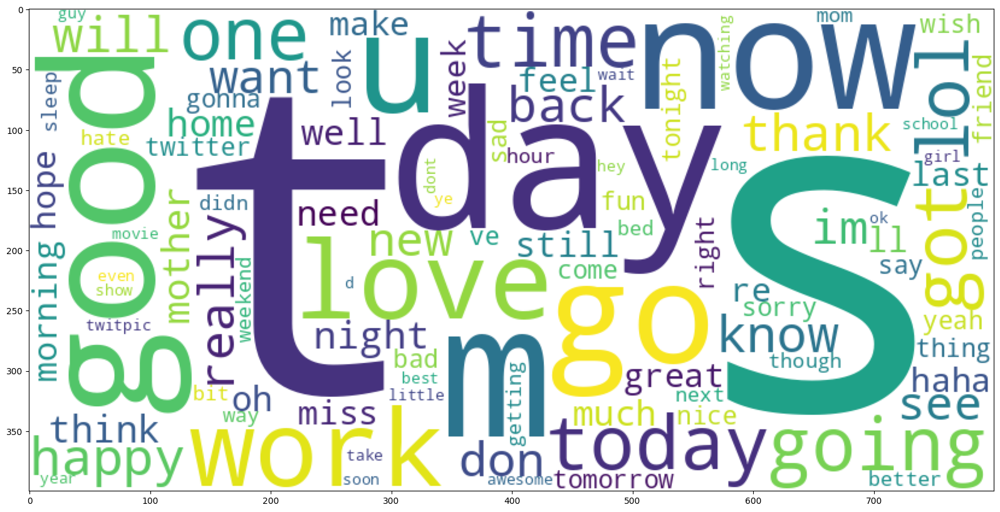

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

a = " ".join(clean_questions["text"])
print(a)

en_cloud = WordCloud(max_words=100, background_color='white',
                     width=800, height=400,
                     collocations=False).generate(a)
fig = plt.figure(figsize=(20, 10))
plt.imshow(en_cloud);

In [ ]:
from nltk.tokenize import RegexpTokenizer

tokenizer = RegexpTokenizer(r'\w+')

clean_questions["tokens"] = clean_questions["text"].apply(tokenizer.tokenize)
clean_questions.head()

,textID,text,selected_text,sentiment,tokens
0,cb774db0d1,"i`d have responded, if i were going","i`d have responded, if i were going",1,"[i, d, have, responded, if, i, were, going]"
1,549e992a42,sooo sad i will miss you here in san diego!!!,sooo sad i will miss you here in san diego!!!,0,"[sooo, sad, i, will, miss, you, here, in, san,..."
2,088c60f138,my boss is bullying me...,my boss is bullying me...,0,"[my, boss, is, bullying, me]"
3,9642c003ef,what interview! leave me alone,what interview! leave me alone,0,"[what, interview, leave, me, alone]"
4,358bd9e861,"sons of ****, why couldn`t they put them on t...","sons of ****, why couldn`t they put them on t...",0,"[sons, of, why, couldn, t, they, put, them, on..."


In [ ]:

!pip install  keras

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from  keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

all_words = [word for tokens in clean_questions["tokens"] for word in tokens]
sentence_lengths = [len(tokens) for tokens in clean_questions["tokens"]]
VOCAB = sorted(list(set(all_words)))
print("%s слов всего, словарный запас состоит %s слов" % (len(all_words), len(VOCAB)))
print("Максимальная длина предложения %s слов" % max(sentence_lengths))

367556 слов всего, словарный запас состоит 26477 слов
Максимальная длина предложения 39 слов


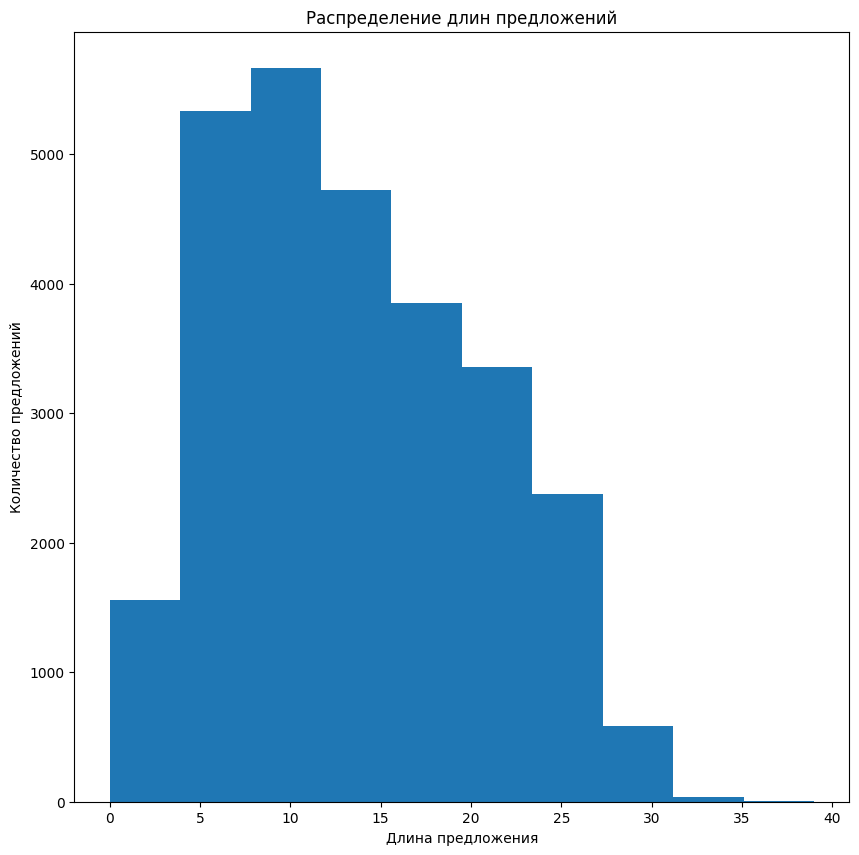

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10, 10))
plt.xlabel('Длина предложения')
plt.ylabel('Количество предложений')
plt.title("Распределение длин предложений")
plt.hist(sentence_lengths)
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

def cv(data):
    count_vectorizer = CountVectorizer()
    emb = count_vectorizer.fit_transform(data)
    return emb, count_vectorizer



list_corpus = clean_questions["text"].tolist()
list_labels = clean_questions["sentiment"].tolist()

X_train, X_test, y_train, y_test = train_test_split(list_corpus, list_labels, test_size=0.2,
                                                                                random_state=40)

X_train_counts, count_vectorizer = cv(X_train)
X_test_counts = count_vectorizer.transform(X_test)

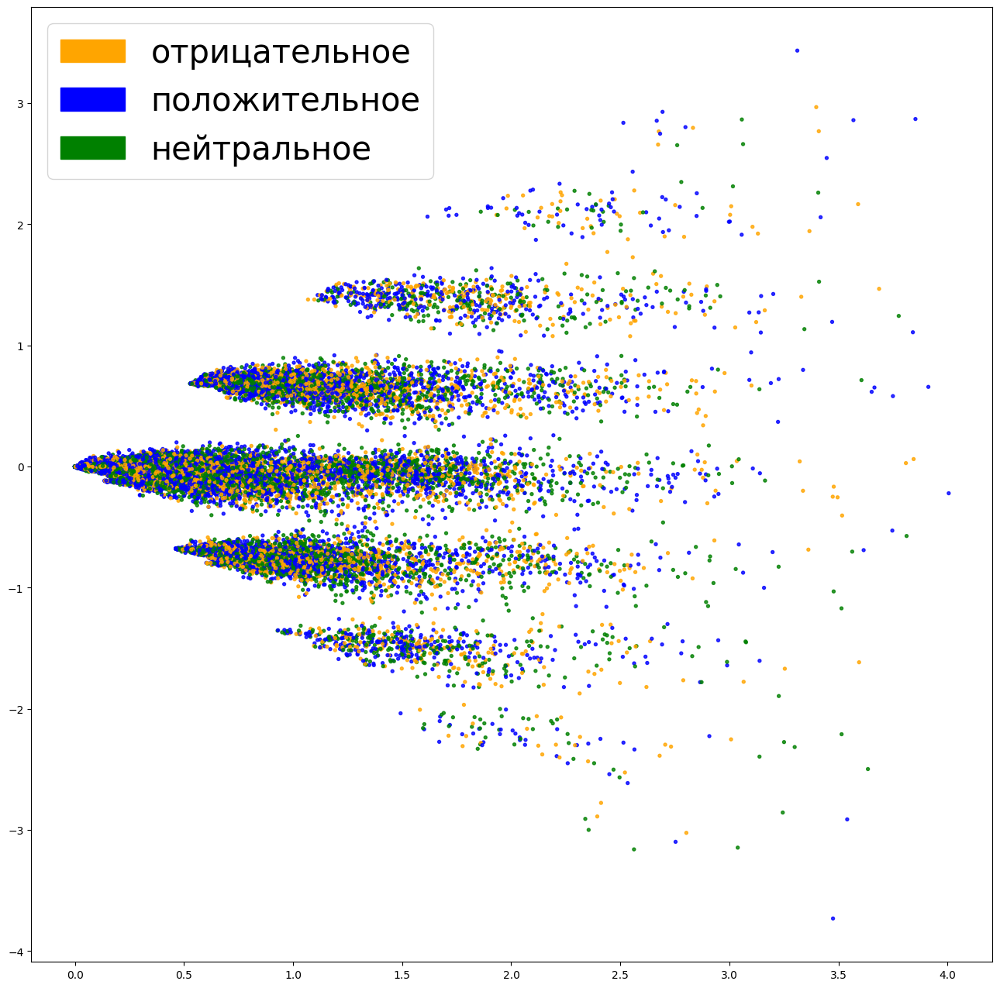

In [ ]:
from sklearn.decomposition import PCA, TruncatedSVD
import matplotlib
import matplotlib.patches as mpatches


def plot_LSA(test_data, test_labels, savepath="PCA_demo.csv", plot=True):
        lsa = TruncatedSVD(n_components=3)
        lsa.fit(test_data)
        lsa_scores = lsa.transform(test_data)
        color_mapper = {label:idx for idx,label in enumerate(set(test_labels))}
        color_column = [color_mapper[label] for label in test_labels]
        colors = ['orange','blue','green']
        if plot:
            plt.scatter(lsa_scores[:,0], lsa_scores[:,1], s=8, alpha=.8, c=test_labels, cmap=matplotlib.colors.ListedColormap(colors))
            red_patch = mpatches.Patch(color='orange', label='отрицательное')
            green_patch = mpatches.Patch(color='green', label='нейтральное')
            blue_patch = mpatches.Patch(color='blue', label='положительное')
            plt.legend(handles=[red_patch,blue_patch,green_patch], prop={'size': 30})


fig = plt.figure(figsize=(16, 16))
plot_LSA(X_train_counts, y_train)
plt.show()

Всё перемешано

# Классификация

In [ ]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(C=30.0, class_weight='balanced', solver='newton-cg',
                         multi_class='multinomial', n_jobs=-1, random_state=40)
clf.fit(X_train_counts, y_train)

y_predicted_counts = clf.predict(X_test_counts)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, r2_score, classification_report

def get_metrics(y_test, y_predicted):
    # true positives / (true positives+false positives)
    precision = precision_score(y_test, y_predicted, pos_label=None,
                                    average='weighted')
    # true positives / (true positives + false negatives)
    recall = recall_score(y_test, y_predicted, pos_label=None,
                              average='weighted')

    # harmonic mean of precision and recall
    f1 = f1_score(y_test, y_predicted, pos_label=None, average='weighted')

    r2 = r2_score(y_test, y_predicted)
    # true positives + true negatives/ total
    accuracy = accuracy_score(y_test, y_predicted)
    return accuracy, precision, recall, f1, r2

accuracy, precision, recall, f1, r2 = get_metrics(y_test, y_predicted_counts)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f, r2 = %.3f" % (accuracy, precision, recall, f1,r2))

accuracy = 0.653, precision = 0.653, recall = 0.653, f1 = 0.653, r2 = 0.214


Матрица ошибок

In [ ]:
import numpy as np
import itertools
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.winter):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=30)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, fontsize=20)
    plt.yticks(tick_marks, classes, fontsize=20)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center",
                 color="white" if cm[i, j] < thresh else "black", fontsize=40)

    plt.tight_layout()
    plt.ylabel('True label', fontsize=30)
    plt.xlabel('Predicted label', fontsize=30)

    return plt

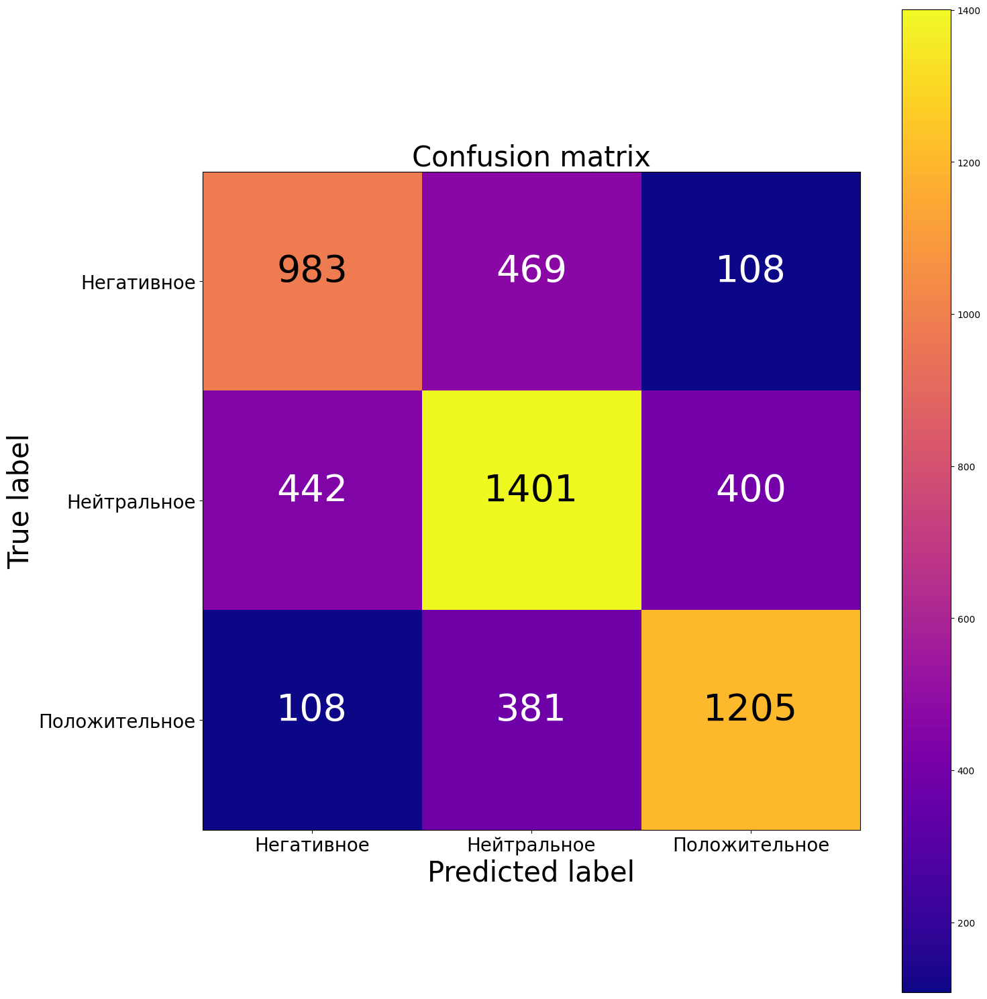

[[ 983  469  108]
 [ 442 1401  400]
 [ 108  381 1205]]


In [ ]:
cm = confusion_matrix(y_test, y_predicted_counts)
fig = plt.figure(figsize=(15, 15))
plot = plot_confusion_matrix(cm, classes=['Негативное','Нейтральное','Положительное'], normalize=False, title='Confusion matrix', cmap="plasma")
plt.show()
print(cm)

In [ ]:
def get_most_important_features(vectorizer, model, n=5):

    index_to_word = {v: k for k, v in vectorizer.vocabulary_.items()}

    # Хранение ключевых слов для каждого класса
    classes = {}
    for class_index in range(model.coef_.shape[0]):  # Для каждого класса
        word_importances = [(coef, index_to_word[i]) for i, coef in enumerate(model.coef_[class_index])]
        sorted_coeff = sorted(word_importances, key=lambda x: x[0], reverse=True)

        # Топ и наименее важные слова
        tops = sorted(sorted_coeff[:n], key=lambda x: x[0])
        bottom = sorted_coeff[-n:]
        classes[class_index] = {
            'tops': tops,
            'bottom': bottom
        }
    return classes


importance = get_most_important_features(count_vectorizer, clf, 10)

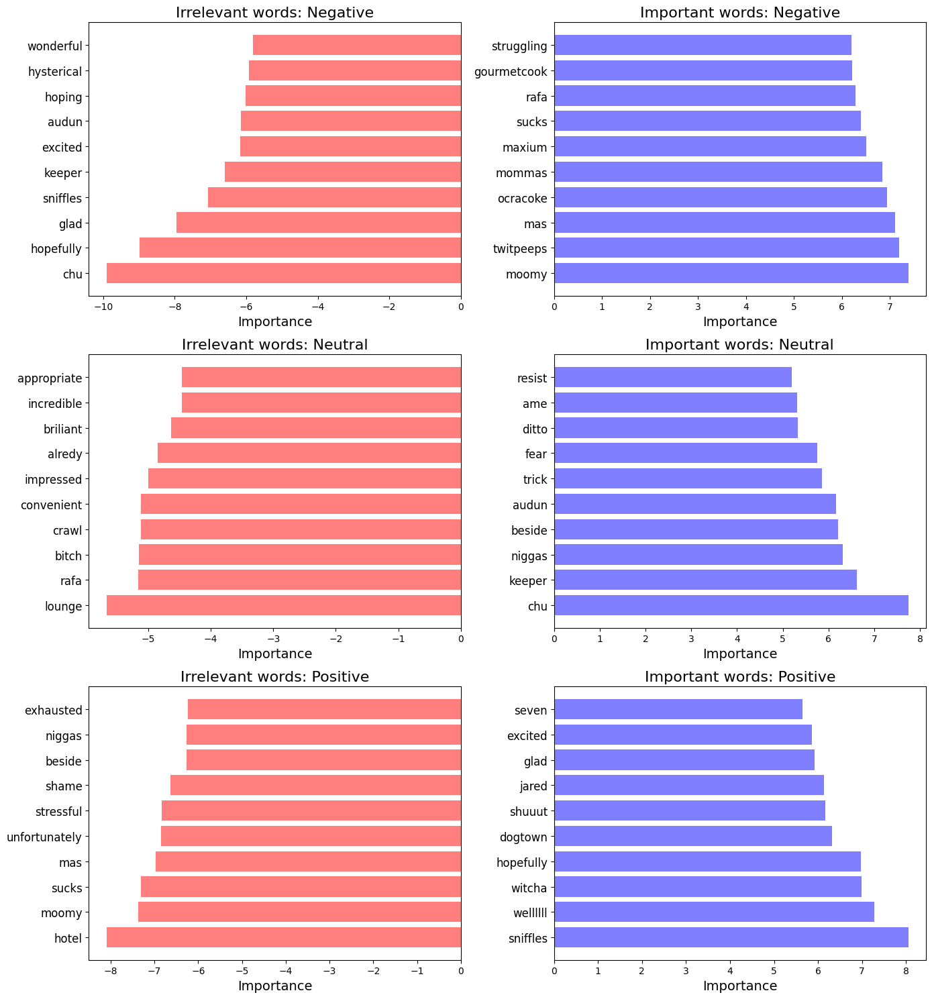

In [ ]:
def plot_important_words_multi(importance, class_labels, n=5):

    num_classes = len(class_labels)
    fig, axes = plt.subplots(num_classes, 2, figsize=(14, 5 * num_classes))

    for class_index, label in enumerate(class_labels):
        # Извлекаем топовые и наименее важные слова для класса
        top_scores = [a[0] for a in importance[class_index]['tops']]
        top_words = [a[1] for a in importance[class_index]['tops']]
        bottom_scores = [a[0] for a in importance[class_index]['bottom']]
        bottom_words = [a[1] for a in importance[class_index]['bottom']]

        # Подготовка данных для графиков
        y_pos_top = np.arange(len(top_words))
        y_pos_bottom = np.arange(len(bottom_words))

        # Сортируем для лучшего отображения
        top_pairs = sorted(zip(top_words, top_scores), key=lambda x: x[1])
        bottom_pairs = sorted(zip(bottom_words, bottom_scores), key=lambda x: x[1], reverse=True)

        top_words, top_scores = zip(*top_pairs)
        bottom_words, bottom_scores = zip(*bottom_pairs)

        axes[class_index, 0].barh(y_pos_bottom, bottom_scores, align='center', alpha=0.5, color='red')
        axes[class_index, 0].set_yticks(y_pos_bottom)
        axes[class_index, 0].set_yticklabels(bottom_words, fontsize=12)
        axes[class_index, 0].invert_yaxis()
        axes[class_index, 0].set_title(f"Irrelevant words: {label}", fontsize=16)
        axes[class_index, 0].set_xlabel("Importance", fontsize=14)

        axes[class_index, 1].barh(y_pos_top, top_scores, align='center', alpha=0.5, color='blue')
        axes[class_index, 1].set_yticks(y_pos_top)
        axes[class_index, 1].set_yticklabels(top_words, fontsize=12)
        axes[class_index, 1].invert_yaxis()
        axes[class_index, 1].set_title(f"Important words: {label}", fontsize=16)
        axes[class_index, 1].set_xlabel("Importance", fontsize=14)

    plt.tight_layout()
    plt.show()


class_labels = ["Negative", "Neutral", "Positive"]

# Построение графиков
plot_important_words_multi(importance, class_labels)

Какую-никакую зависимость можно проследить (wellll, glad, hopefully в положительном настроении)

# Учитываем структуру словаря

In [ ]:
def tfidf(data):
    tfidf_vectorizer = TfidfVectorizer()

    train = tfidf_vectorizer.fit_transform(data)

    return train, tfidf_vectorizer

X_train_tfidf, tfidf_vectorizer = tfidf(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

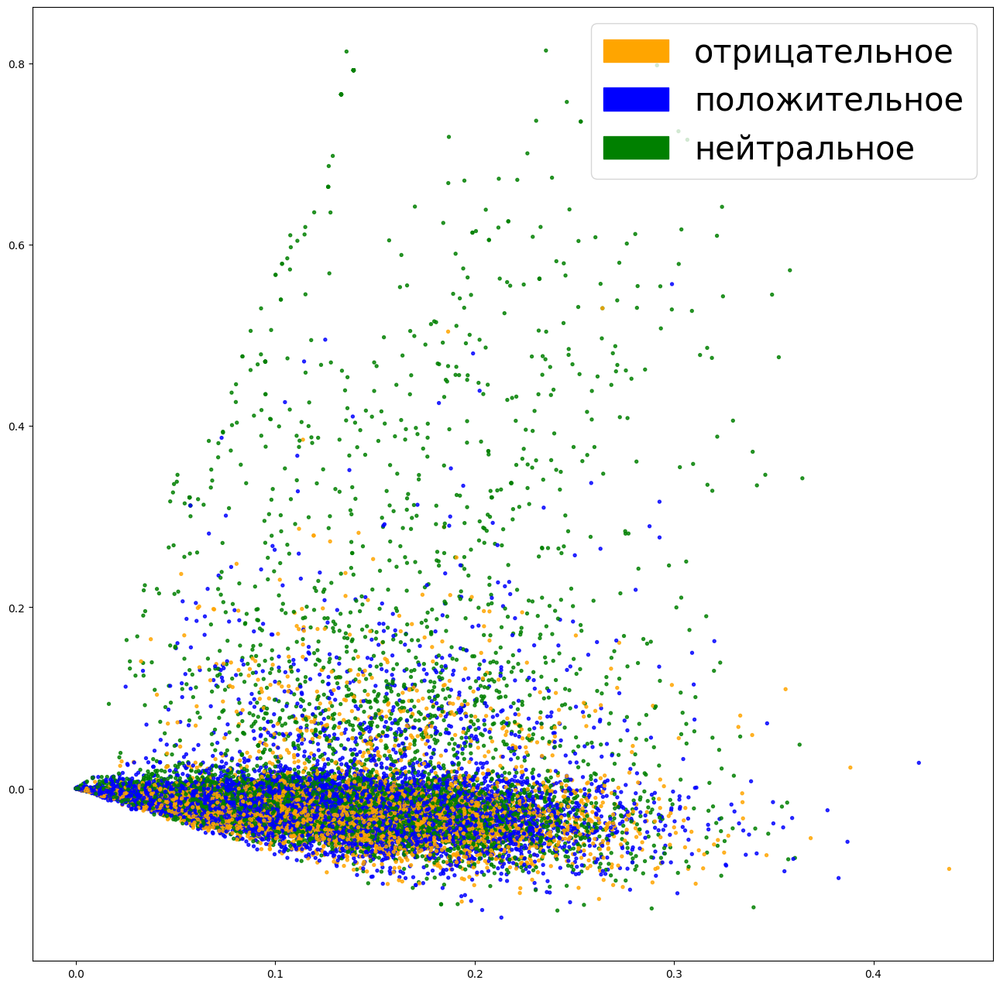

In [ ]:
fig = plt.figure(figsize=(16, 16))
plot_LSA(X_train_tfidf, y_train)
plt.show()

In [ ]:
clf_tfidf = LogisticRegression(C=30.0, class_weight='balanced', solver='newton-cg',
                         multi_class='multinomial', n_jobs=-1, random_state=40)
clf_tfidf.fit(X_train_tfidf, y_train)

y_predicted_tfidf = clf_tfidf.predict(X_test_tfidf)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


In [ ]:
accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf, r2_tfidf = get_metrics(y_test, y_predicted_tfidf)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f, r2 = %.3f"  % (accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf, r2_tfidf))

accuracy = 0.664, precision = 0.664, recall = 0.664, f1 = 0.664, r2 = 0.244


Стало чуть лучше

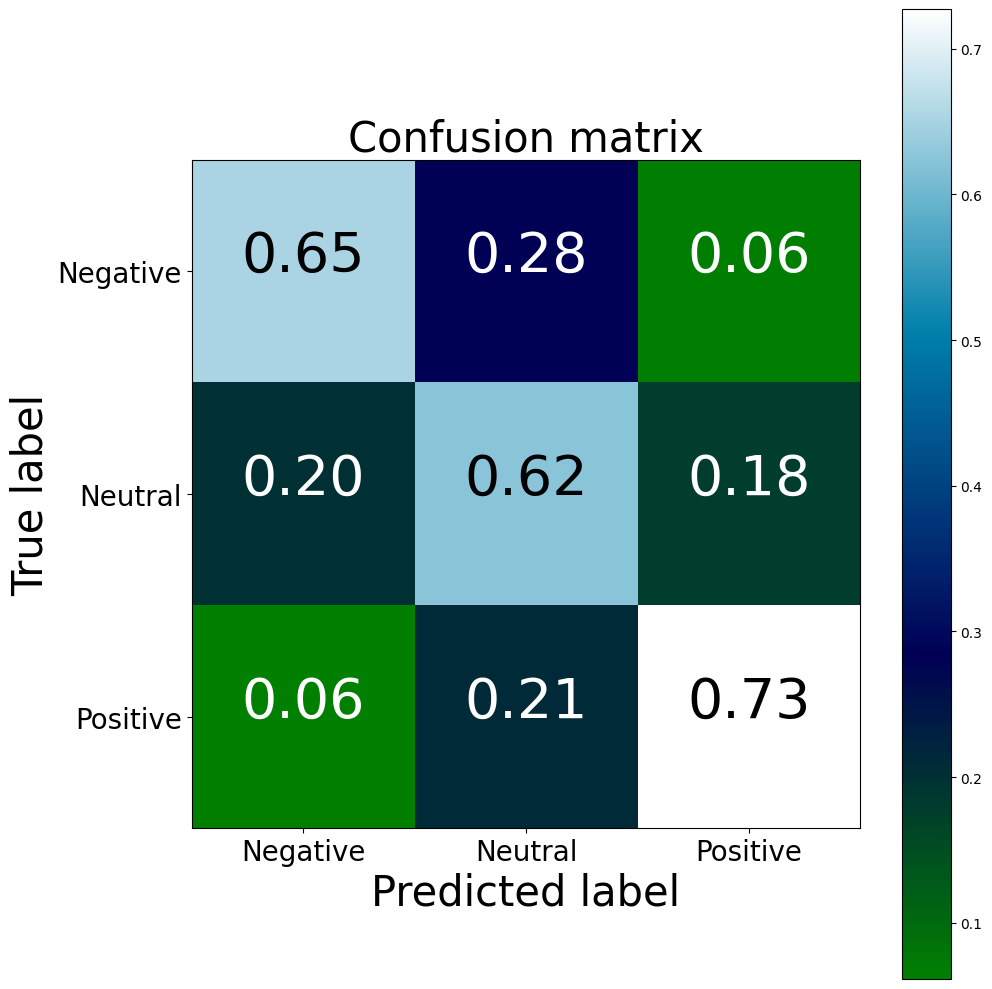

TFIDF confusion matrix
[[1019  441  100]
 [ 447 1400  396]
 [ 104  358 1232]]
BoW confusion matrix
[[ 983  469  108]
 [ 442 1401  400]
 [ 108  381 1205]]


In [ ]:
cm2 = confusion_matrix(y_test, y_predicted_tfidf)
fig = plt.figure(figsize=(10, 10))
plot = plot_confusion_matrix(cm2, classes=["Negative", "Neutral", "Positive"], normalize=True, title='Confusion matrix', cmap="ocean")
plt.show()
print("TFIDF confusion matrix")
print(cm2)
print("BoW confusion matrix")
print(cm)

In [ ]:
importance_tfidf = get_most_important_features(tfidf_vectorizer, clf_tfidf, 10)

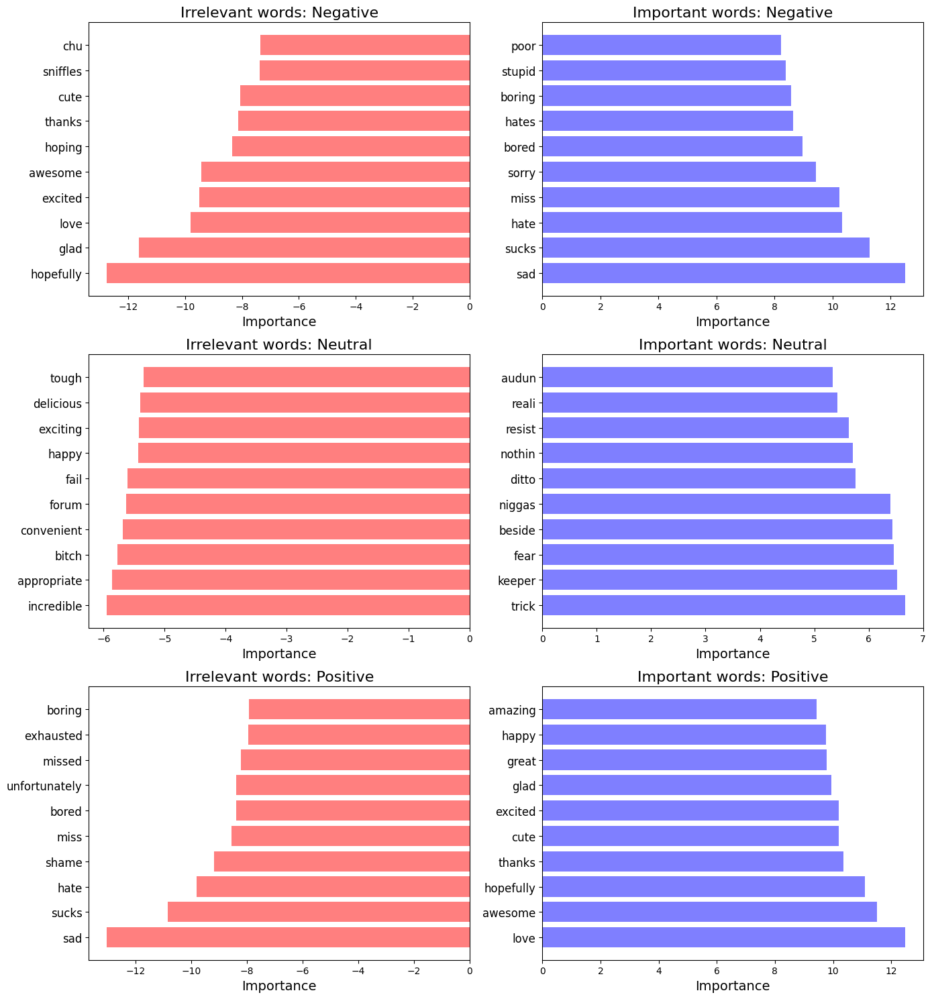

In [ ]:
class_labels = ["Negative", "Neutral", "Positive"]

# Построение графиков
plot_important_words_multi(importance_tfidf, class_labels)

Определяющие слова стали больше подходить по настроению твита

In [ ]:
!python -m gensim.downloader --download word2vec-google-news-300

2024-11-24 12:36:03,986 : __main__ : INFO : Creating /root/gensim-data
[==================================================] 100.0% 1662.8/1662.8MB downloaded
2024-11-24 12:37:28,913 : __main__ : INFO : word2vec-google-news-300 downloaded
2024-11-24 12:37:28,913 : __main__ : INFO : Data has been installed and data path is /root/gensim-data/word2vec-google-news-300/word2vec-google-news-300.gz


In [ ]:
import gensim

# Load Google's pre-trained Word2Vec model.
word2vec_path = "~/gensim-data/word2vec-google-news-300/word2vec-google-news-300.gz"
word2vec = gensim.models.KeyedVectors.load_word2vec_format(word2vec_path, binary=True)

In [ ]:
def get_average_word2vec(tokens_list, vector, generate_missing=False, k=300):
    if len(tokens_list)<1:
        return np.zeros(k)
    if generate_missing:
        vectorized = [vector[word] if word in vector else np.random.rand(k) for word in tokens_list]
    else:
        vectorized = [vector[word] if word in vector else np.zeros(k) for word in tokens_list]
    length = len(vectorized)
    summed = np.sum(vectorized, axis=0)
    averaged = np.divide(summed, length)
    return averaged

def get_word2vec_embeddings(vectors, clean_questions, generate_missing=False):
    embeddings = clean_questions['tokens'].apply(lambda x: get_average_word2vec(x, vectors,
                                                                                generate_missing=generate_missing))
    return list(embeddings)

In [ ]:
embeddings = get_word2vec_embeddings(word2vec, clean_questions)
X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec = train_test_split(embeddings, list_labels,
                                                                                        test_size=0.2, random_state=40)

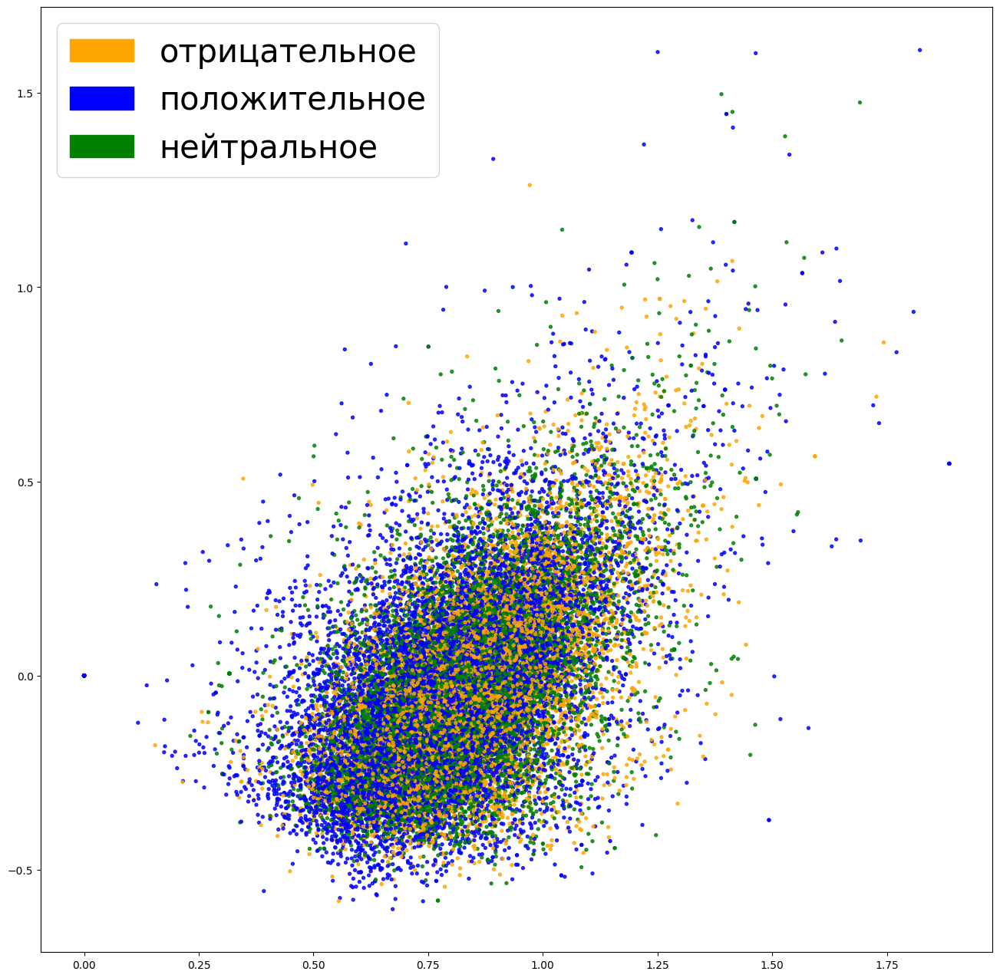

In [ ]:
fig = plt.figure(figsize=(16, 16))
plot_LSA(embeddings, list_labels)
plt.show()

In [ ]:
clf_w2v = LogisticRegression(C=30.0, class_weight='balanced', solver='newton-cg',
                         multi_class='multinomial', random_state=40)
clf_w2v.fit(X_train_word2vec, y_train_word2vec)
y_predicted_word2vec = clf_w2v.predict(X_test_word2vec)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


In [ ]:
accuracy_word2vec, precision_word2vec, recall_word2vec, f1_word2vec, r2_word2vec = get_metrics(y_test_word2vec, y_predicted_word2vec)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f, r2 = %.3f" % (accuracy_word2vec, precision_word2vec, recall_word2vec, f1_word2vec, r2_word2vec))

accuracy = 0.667, precision = 0.667, recall = 0.667, f1 = 0.667, r2 = 0.230


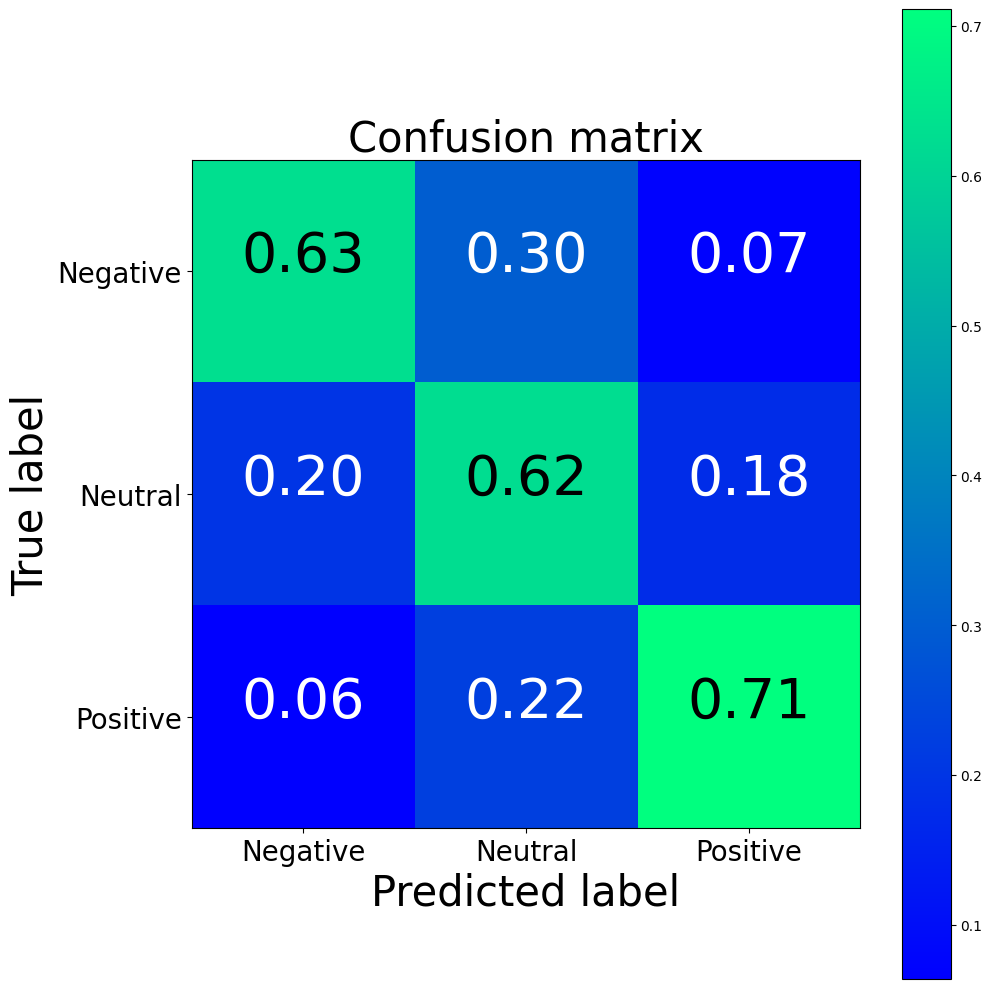

Word2Vec confusion matrix
[[1081  380   99]
 [ 446 1380  417]
 [ 126  360 1208]]
TFIDF confusion matrix
[[1019  441  100]
 [ 447 1400  396]
 [ 104  358 1232]]
BoW confusion matrix
[[ 983  469  108]
 [ 442 1401  400]
 [ 108  381 1205]]


In [ ]:
cm_w2v = confusion_matrix(y_test_word2vec, y_predicted_word2vec)
fig = plt.figure(figsize=(10, 10))
plot = plot_confusion_matrix(cm, classes=["Negative", "Neutral", "Positive"], normalize=True, title='Confusion matrix')
plt.show()
print("Word2Vec confusion matrix")
print(cm_w2v)
print("TFIDF confusion matrix")
print(cm2)
print("BoW confusion matrix")
print(cm)

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 9.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=63c0fb2b369628f19f72af876593a3b24dd1d10ae2d7fd575ddb44110b9640e4
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
from lime import lime_text
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer

X_train_data, X_test_data, y_train_data, y_test_data = train_test_split(list_corpus, list_labels, test_size=0.2,
                                                                                random_state=40)
vector_store = word2vec
def word2vec_pipeline(examples):
    global vector_store
    tokenizer = RegexpTokenizer(r'\w+')
    tokenized_list = []
    for example in examples:
        example_tokens = tokenizer.tokenize(example)
        vectorized_example = get_average_word2vec(example_tokens, vector_store, generate_missing=False, k=300)
        tokenized_list.append(vectorized_example)
    return clf_w2v.predict_proba(tokenized_list)

c = make_pipeline(count_vectorizer, clf)

In [ ]:
def explain_one_instance(instance, class_names):
    explainer = LimeTextExplainer(class_names=class_names)
    exp = explainer.explain_instance(instance, word2vec_pipeline, num_features=6)
    return exp

def visualize_one_exp(features, labels, index, class_names = ["irrelevant","relevant", "unknown"]):
    exp = explain_one_instance(features[index], class_names = class_names)
    print('Index: %d' % index)
    print('True class: %s' % class_names[labels[index]])
    exp.show_in_notebook(text=True)

In [ ]:
visualize_one_exp(X_test_data, y_test_data, 65)

Index: 65
True class: unknown


In [ ]:
visualize_one_exp(X_test_data, y_test_data, 60)

Index: 60
True class: relevant


In [ ]:
import random
from collections import defaultdict

random.seed(40)

def get_statistical_explanation(test_set, sample_size, word2vec_pipeline, label_dict):
    sample_sentences = random.sample(test_set, sample_size)
    explainer = LimeTextExplainer()

    labels_to_sentences = defaultdict(list)
    contributors = defaultdict(dict)

    # First, find contributing words to each class
    for sentence in sample_sentences:
        probabilities = word2vec_pipeline([sentence])
        curr_label = probabilities[0].argmax()
        labels_to_sentences[curr_label].append(sentence)
        exp = explainer.explain_instance(sentence, word2vec_pipeline, num_features=6, labels=[curr_label])
        listed_explanation = exp.as_list(label=curr_label)

        for word,contributing_weight in listed_explanation:
            if word in contributors[curr_label]:
                contributors[curr_label][word].append(contributing_weight)
            else:
                contributors[curr_label][word] = [contributing_weight]

    # average each word's contribution to a class, and sort them by impact
    average_contributions = {}
    sorted_contributions = {}
    for label,lexica in contributors.items():
        curr_label = label
        curr_lexica = lexica
        average_contributions[curr_label] = pd.Series(index=curr_lexica.keys())
        for word,scores in curr_lexica.items():
            average_contributions[curr_label].loc[word] = np.sum(np.array(scores))/sample_size
        detractors = average_contributions[curr_label].sort_values()
        supporters = average_contributions[curr_label].sort_values(ascending=False)
        sorted_contributions[label_dict[curr_label]] = {
            'detractors':detractors,
             'supporters': supporters
        }
    return sorted_contributions

label_to_text = {
    0: 'Нейтральное',
    1: 'Отрицательное',
    2: 'Положительное'
}
sorted_contributions = get_statistical_explanation(X_test_data, 100, word2vec_pipeline, label_to_text)

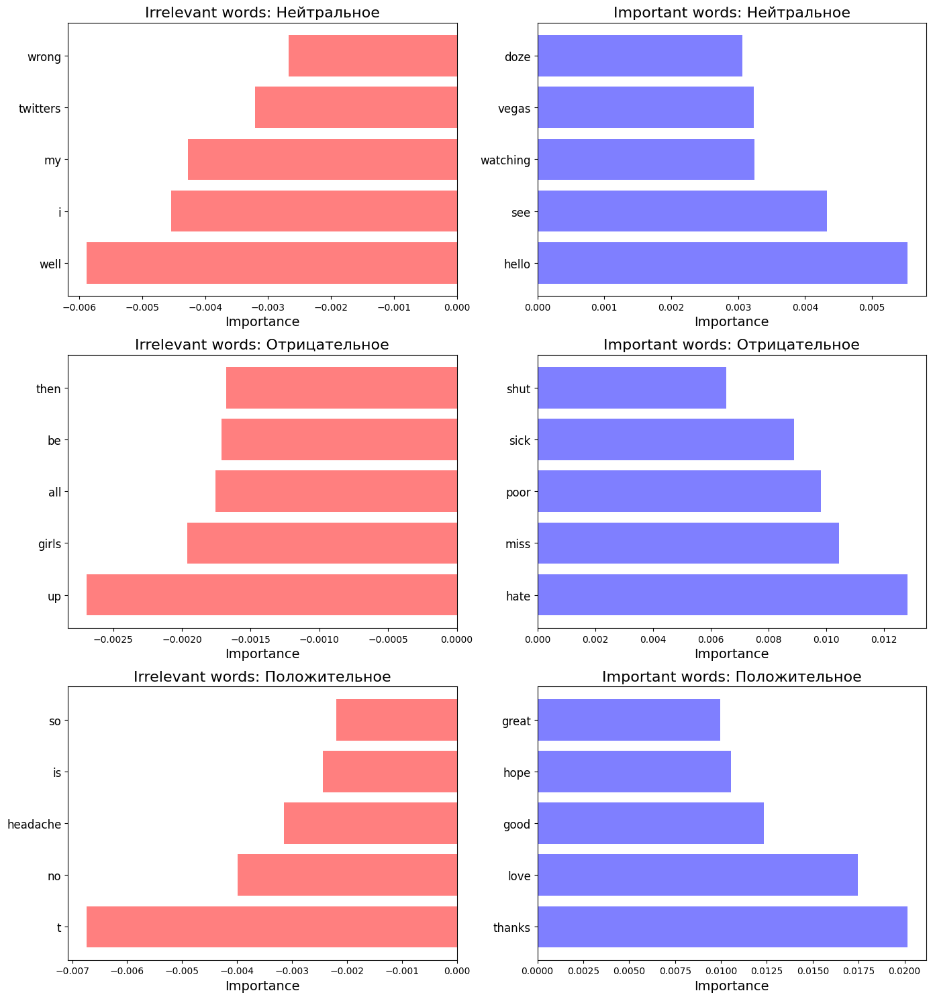

In [ ]:
# Преобразуем sorted_contributions в формат importance
importance_multi = []

for class_label, contributions in sorted_contributions.items():
    detractors = contributions['detractors']
    supporters = contributions['supporters']

    importance_multi.append({
        'tops': [(supporters[word], word) for word in supporters.index[:5]],
        'bottom': [(detractors[word], word) for word in detractors.index[:5]]
    })

# Вызов функции для визуализации
plot_important_words_multi(importance_multi, list(label_to_text.values()), n=5)


# Использование синтаксиса при применении end-to-end подходов

In [ ]:
from tensorflow.keras.preprocessing.text  import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

EMBEDDING_DIM = 300
MAX_SEQUENCE_LENGTH = 35
VOCAB_SIZE = len(VOCAB)

VALIDATION_SPLIT=.2
tokenizer = Tokenizer(num_words=VOCAB_SIZE)
tokenizer.fit_on_texts(clean_questions["text"].tolist())
sequences = tokenizer.texts_to_sequences(clean_questions["text"].tolist())

word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))

cnn_data = pad_sequences(sequences, maxlen=MAX_SEQUENCE_LENGTH)
labels = to_categorical(np.asarray(clean_questions["sentiment"]))

indices = np.arange(cnn_data.shape[0])
np.random.shuffle(indices)
cnn_data = cnn_data[indices]
labels = labels[indices]
num_validation_samples = int(VALIDATION_SPLIT * cnn_data.shape[0])

embedding_weights = np.zeros((len(word_index)+1, EMBEDDING_DIM))
for word,index in word_index.items():
    embedding_weights[index,:] = word2vec[word] if word in word2vec else np.random.rand(EMBEDDING_DIM)
print(embedding_weights.shape)

Found 26597 unique tokens.
(26598, 300)


In [ ]:
from keras.layers import Dense, Input, Flatten, Dropout, Concatenate
from keras.layers import Conv1D, MaxPooling1D, Embedding
from keras.layers import LSTM, Bidirectional
from keras.models import Model

def ConvNet(embeddings, max_sequence_length, num_words, embedding_dim, labels_index, trainable=False, extra_conv=True):

    embedding_layer = Embedding(num_words,
                            embedding_dim,
                            weights=[embeddings],
                            input_length=max_sequence_length,
                            trainable=trainable)

    sequence_input = Input(shape=(max_sequence_length,), dtype='int32')
    embedded_sequences = embedding_layer(sequence_input)

    # Yoon Kim model (https://arxiv.org/abs/1408.5882)
    convs = []
    filter_sizes = [3,4,5]

    for filter_size in filter_sizes:
        l_conv = Conv1D(filters=128, kernel_size=filter_size, activation='relu')(embedded_sequences)
        l_pool = MaxPooling1D(pool_size=3)(l_conv)
        convs.append(l_pool)

    l_merge = Concatenate(axis=1)(convs)

    # add a 1D convnet with global maxpooling, instead of Yoon Kim model
    conv = Conv1D(filters=128, kernel_size=3, activation='relu')(embedded_sequences)
    pool = MaxPooling1D(pool_size=3)(conv)

    if extra_conv==True:
        x = Dropout(0.5)(l_merge)
    else:
        # Original Yoon Kim model
        x = Dropout(0.5)(pool)
    x = Flatten()(x)
    x = Dense(128, activation='relu')(x)
    #x = Dropout(0.5)(x)

    preds = Dense(labels_index, activation='softmax')(x)

    model = Model(sequence_input, preds)
    model.compile(loss='categorical_crossentropy',
                  optimizer='adam',
                  metrics=['acc'])

    return model

In [ ]:
x_train = cnn_data[:-num_validation_samples]
y_train = labels[:-num_validation_samples]
x_val = cnn_data[-num_validation_samples:]
y_val = labels[-num_validation_samples:]

model = ConvNet(embedding_weights, MAX_SEQUENCE_LENGTH, len(word_index)+1, EMBEDDING_DIM,
                len(list(clean_questions["sentiment"].unique())), False)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


In [ ]:
model.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=10, batch_size=128)

Epoch 1/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - acc: 0.4365 - loss: 1.0557 - val_acc: 0.6654 - val_loss: 0.7609
Epoch 2/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - acc: 0.6815 - loss: 0.7231 - val_acc: 0.7083 - val_loss: 0.6856
Epoch 3/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - acc: 0.7262 - loss: 0.6527 - val_acc: 0.7169 - val_loss: 0.6766
Epoch 4/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - acc: 0.7497 - loss: 0.5965 - val_acc: 0.7191 - val_loss: 0.6729
Epoch 5/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - acc: 0.7804 - loss: 0.5326 - val_acc: 0.7254 - val_loss: 0.6874
Epoch 6/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - acc: 0.8138 - loss: 0.4614 - val_acc: 0.7123 - val_loss: 0.7051
Epoch 7/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - acc: 0.8413 - loss: 0.4002 - val_acc: 0.7209 - val_loss: 0.7464
Epoch 8/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - acc: 0.8635 - loss: 0.3467 - val_acc: 0.7109 - val_loss: 0.8075
Epoch 9/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - 

In [ ]:
y_pred = model.predict(x_val)

172/172 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step


In [ ]:
y_pred_cnn = np.argmax(y_pred, axis=1)
y_val_cnn = np.argmax(y_val, axis=1)

In [ ]:
y_val_cnn

array([2, 1, 0, ..., 2, 0, 0])

In [ ]:
accuracy_cnn, precision_cnn, recall_cnn, f1_cnn, r2_cnn = get_metrics(y_val_cnn, y_pred_cnn)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f, r2 = %.3f" % (accuracy_cnn, precision_cnn, recall_cnn, f1_cnn, r2_cnn))

accuracy = 0.711, precision = 0.714, recall = 0.711, f1 = 0.711, r2 = 0.369


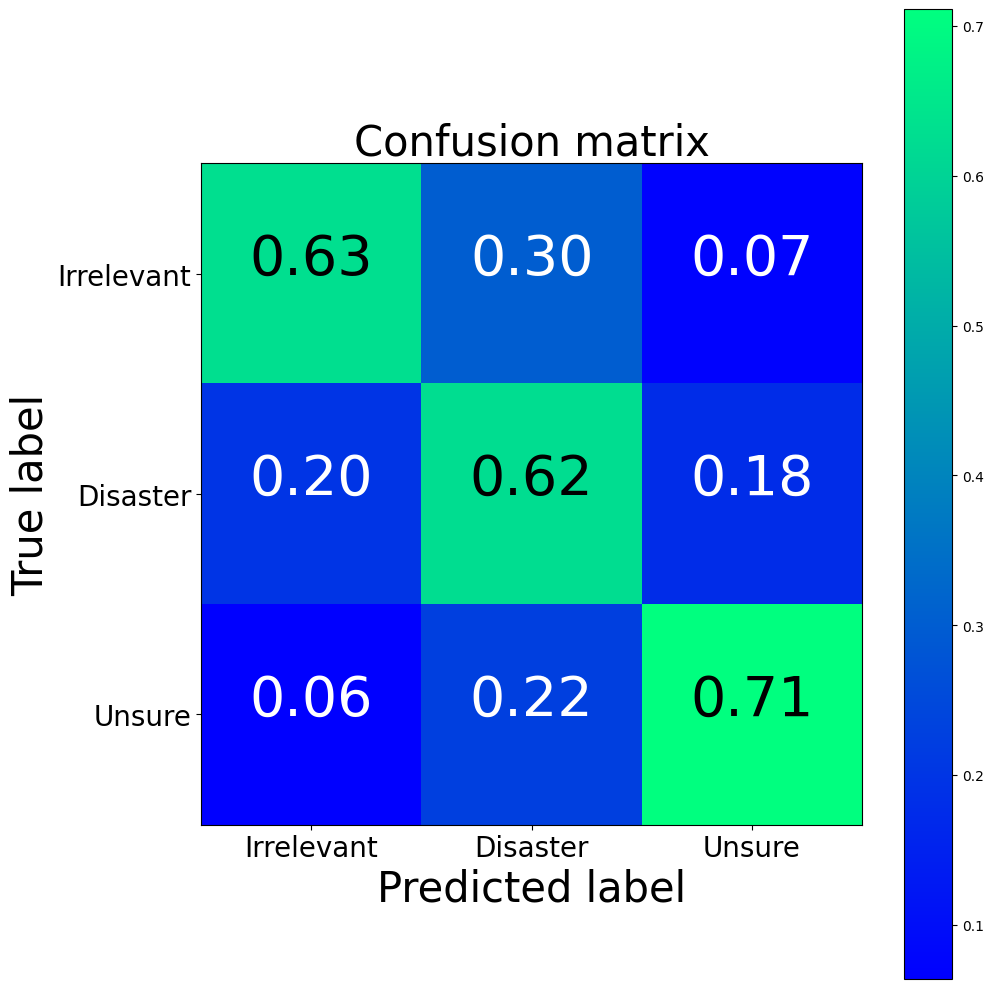

CNN confusion matrix
[[1023  438   60]
 [ 338 1640  292]
 [  88  373 1244]]
Word2Vec confusion matrix
[[1081  380   99]
 [ 446 1380  417]
 [ 126  360 1208]]
TFIDF confusion matrix
[[1019  441  100]
 [ 447 1400  396]
 [ 104  358 1232]]
BoW confusion matrix
[[ 983  469  108]
 [ 442 1401  400]
 [ 108  381 1205]]


In [ ]:
cm_cnn = confusion_matrix(y_val_cnn, y_pred_cnn)
fig = plt.figure(figsize=(10, 10))
plot = plot_confusion_matrix(cm, classes=['Irrelevant','Disaster','Unsure'], normalize=True, title='Confusion matrix')
plt.show()

print("CNN confusion matrix")
print(cm_cnn)
print("Word2Vec confusion matrix")
print(cm_w2v)
print("TFIDF confusion matrix")
print(cm2)
print("BoW confusion matrix")
print(cm)

# Выводы


По метрикам лучше всего себя свёрточная нейросеть.